In [3]:
#Import liabraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

# Read un the data

df = pd.read_csv(r'C:\Users\jleiv\OneDrive\Documentos\SQL\movies.csv')

In [4]:
#Looking at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [51]:
df['yearcorrect'] = df['released'].astype(str).str.split().str[2]

In [52]:
#Checking if there is any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 0%
gross - 0%
company - 0%
runtime - 0%
yearcorrect - 0%


In [53]:
#Data types for columns

df.dtypes

name            object
rating          object
genre           object
year             int64
released        object
score          float64
votes          float64
director        object
writer          object
star            object
country         object
budget           int32
gross            int32
company         object
runtime        float64
yearcorrect     object
dtype: object

In [62]:
df['budget'] = pd.to_numeric(df['budget'], errors='coerce').fillna(0).astype(int)
df['gross'] = pd.to_numeric(df['gross'], errors='coerce').fillna(0).astype(int) 
df['score'] = pd.to_numeric(df['score'], errors='coerce').fillna(0).astype(int) 
df['votes'] = pd.to_numeric(df['votes'], errors='coerce').fillna(0).astype(int) 
df['runtime'] = pd.to_numeric(df['runtime'], errors='coerce').fillna(0).astype(int) 

In [32]:
df = df.sort_values(by=['gross'], inplace=False,ascending=False)

In [25]:
pd.set_option('display.max_rows', None)

In [28]:
#Looking for duplicates
#(showing unique values)
df['company'].drop_duplicates().sort_values(ascending=False)

7129                                              thefyzz
5664                                          micro_scope
6412                             iDeal Partners Film Fund
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
524                             Zupnik-Curtis Enterprises
3330                          Zucker Brothers Productions
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
6222                        Zentropa International Norway
3368                              Zentropa Entertainments
535                                  Zenith Entertainment
5180                                      Zazen Produções
3193                                          ZapPictures
1321                             Zanuck/Brown Productions
1329          

In [29]:
df['company'].drop_duplicates()

0                                            Warner Bros.
1                                       Columbia Pictures
2                                               Lucasfilm
3                                      Paramount Pictures
4                                          Orion Pictures
6                                      Universal Pictures
7                            Chartoff-Winkler Productions
8                                          Dovemead Films
9                                          United Artists
10                                    The Malpaso Company
11                                           C.A.T. Films
14                                      Filmways Pictures
15                                        Rastar Pictures
16                              Metro-Goldwyn-Mayer (MGM)
17                                              IPC Films
18                                  AVCO Embassy Pictures
20                             Lorimar Film Entertainment
21            

In [30]:
#Budget high correlation **

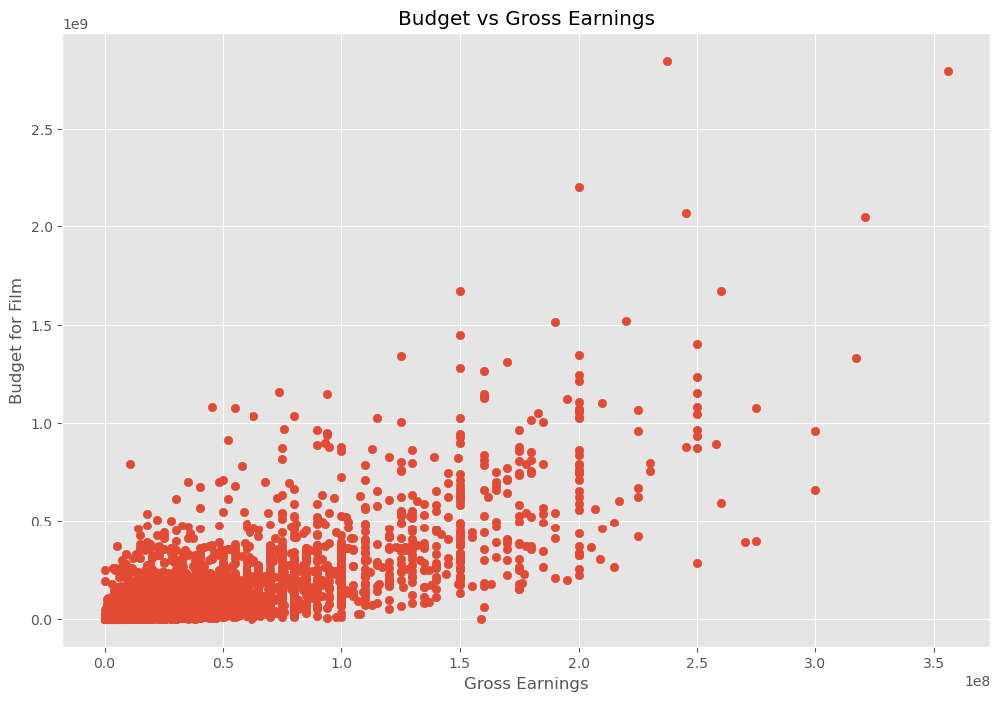

In [34]:
#Scatter plot with budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel('Gross Earnings')

plt.ylabel('Budget for Film')

plt.show()

In [35]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162.0,"mber 18, 2009 (United States)"
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181.0,"l 26, 2019 (United States)"
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194.0,"mber 19, 1997 (United States)"
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138.0,"mber 18, 2015 (United States)"
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149.0,"l 27, 2018 (United States)"


<Axes: xlabel='budget', ylabel='gross'>

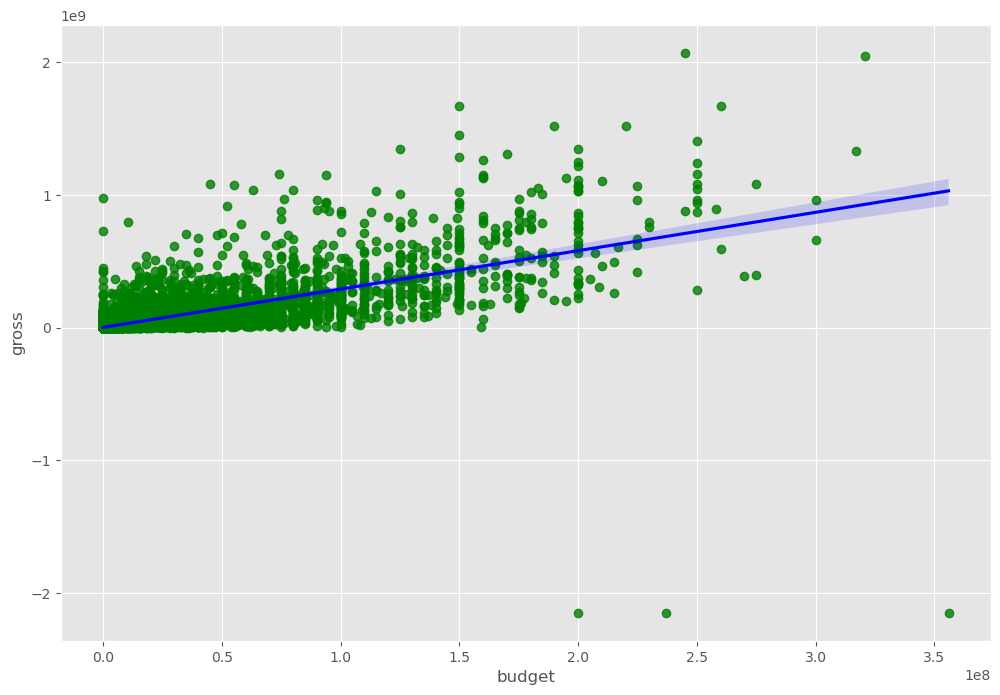

In [56]:
#Plot budget vs gross using seaborn

sns.regplot(x='budget',y='gross', data=df, scatter_kws={'color': 'green'}, line_kws={'color':'blue'})

In [40]:
# correlation

In [64]:
df = df.dropna()

In [71]:
df.corr(method = 'pearson',numeric_only = True)

,year,score,votes,budget,gross,runtime
year,1.000000,0.100477,0.226450,0.314485,0.258669,0.119817
score,0.100477,1.000000,0.395914,0.054066,0.165716,0.382658
votes,0.226450,0.395914,1.000000,0.485227,0.573835,0.308844
budget,0.314485,0.054066,0.485227,1.000000,0.687248,0.269072
gross,0.258669,0.165716,0.573835,0.687248,1.000000,0.203222
runtime,0.119817,0.382658,0.308844,0.269072,0.203222,1.000000


In [74]:
df.corr(method = 'spearman',numeric_only = True)

,year,score,votes,budget,gross,runtime
year,1.000000,0.102542,0.481831,0.299472,0.321010,0.142744
score,0.102542,1.000000,0.418730,-0.003230,0.133257,0.384407
votes,0.481831,0.418730,1.000000,0.600705,0.750021,0.290316
budget,0.299472,-0.003230,0.600705,1.000000,0.713742,0.248783
gross,0.321010,0.133257,0.750021,0.713742,1.000000,0.253516
runtime,0.142744,0.384407,0.290316,0.248783,0.253516,1.000000


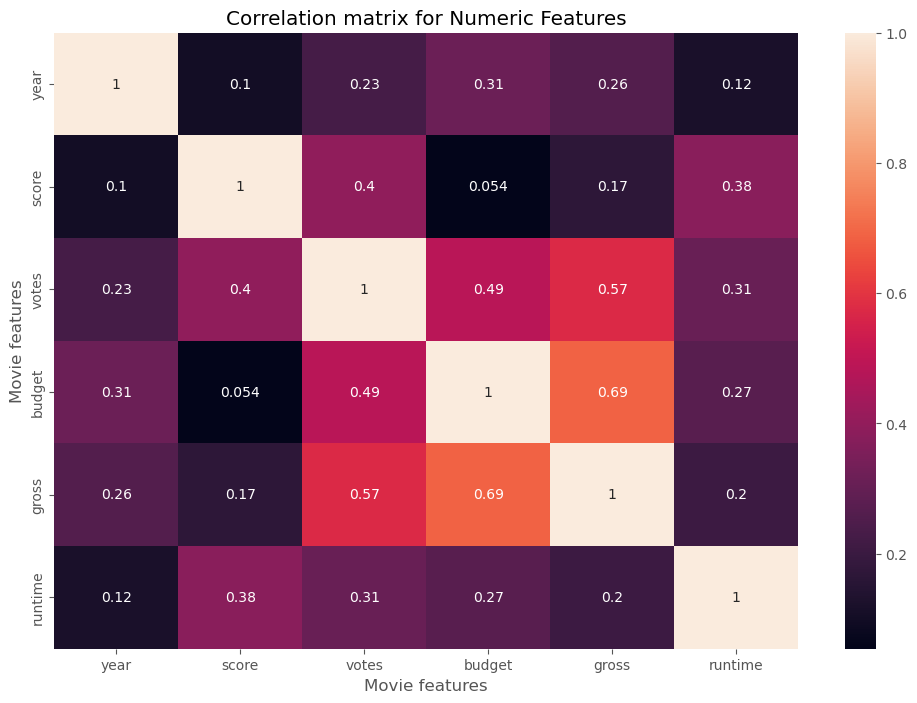

In [75]:
correlation_matrix = df.corr(method = 'pearson',numeric_only = True)

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Numeric Features")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

In [76]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,-2147483648,Twentieth Century Fox,162,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,-2147483648,Marvel Studios,181,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,-2147483648,Twentieth Century Fox,194,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,2018


In [78]:
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,527,5,0,2009,684,7,1100000,1134,1756,2281,55,237000000,-2147483648,2205,162,31
7445,529,5,0,2019,176,8,903000,160,730,2190,55,356000000,-2147483648,1569,181,41
3045,6809,5,6,1997,692,7,1100000,1134,1756,1557,55,200000000,-2147483648,2205,194,19
6663,5076,5,0,2015,686,7,876000,1105,2518,505,55,245000000,2069521700,1503,138,37
7244,530,5,0,2018,185,8,897000,160,730,2190,55,321000000,2048359754,1569,149,40
7480,6113,4,2,2019,1464,6,222000,1430,1895,654,55,260000000,1670727580,2267,118,41
6653,2938,5,0,2015,1680,7,593000,507,3522,421,55,150000000,1670516444,2233,124,37
6043,5426,5,0,2012,2440,8,1300000,1491,2286,2190,55,220000000,1518815515,1569,143,34
6646,2123,5,0,2015,213,7,370000,1167,694,2661,55,190000000,1515341399,2233,137,37
7494,2109,4,2,2019,2640,6,148000,425,1926,1490,55,150000000,1450026933,2266,103,41


In [79]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,527,5,0,2009,684,7,1100000,1134,1756,2281,55,237000000,-2147483648,2205,162,31
7445,529,5,0,2019,176,8,903000,160,730,2190,55,356000000,-2147483648,1569,181,41
3045,6809,5,6,1997,692,7,1100000,1134,1756,1557,55,200000000,-2147483648,2205,194,19
6663,5076,5,0,2015,686,7,876000,1105,2518,505,55,245000000,2069521700,1503,138,37
7244,530,5,0,2018,185,8,897000,160,730,2190,55,321000000,2048359754,1569,149,40
7480,6113,4,2,2019,1464,6,222000,1430,1895,654,55,260000000,1670727580,2267,118,41
6653,2938,5,0,2015,1680,7,593000,507,3522,421,55,150000000,1670516444,2233,124,37
6043,5426,5,0,2012,2440,8,1300000,1491,2286,2190,55,220000000,1518815515,1569,143,34
6646,2123,5,0,2015,213,7,370000,1167,694,2661,55,190000000,1515341399,2233,137,37
7494,2109,4,2,2019,2640,6,148000,425,1926,1490,55,150000000,1450026933,2266,103,41


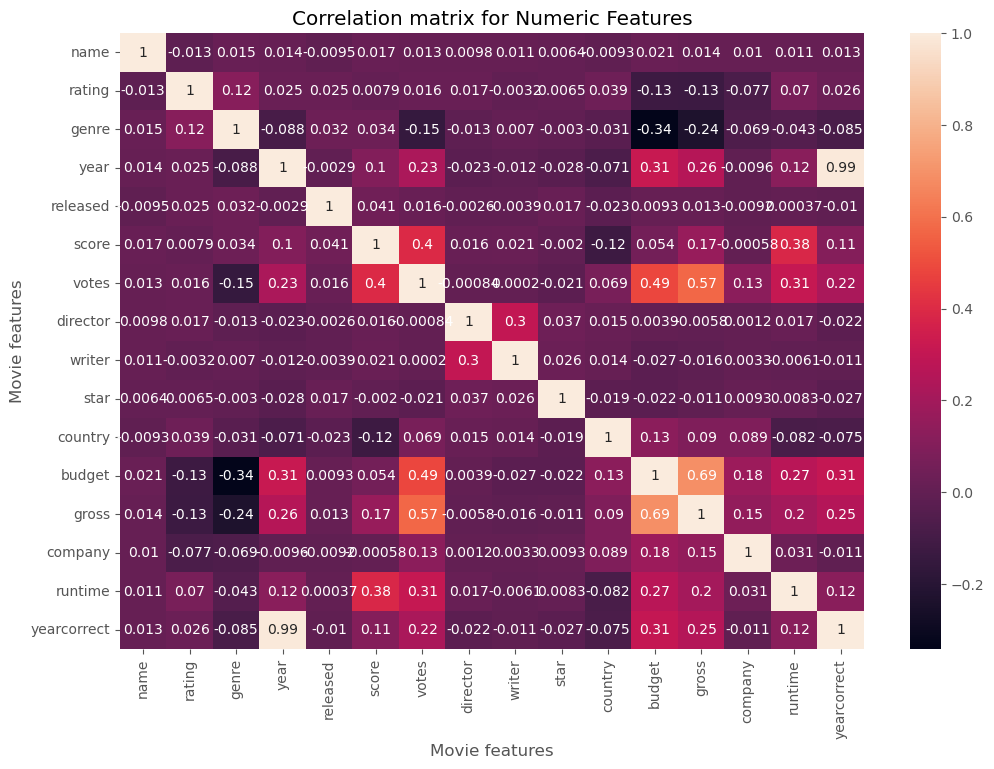

In [81]:
correlation_matrix = df_numerized.corr(method = 'pearson',numeric_only = True)

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Numeric Features")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

In [82]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
name,1.000000,-0.012570,0.015011,0.013610,-0.009495,0.016780,0.013321,0.009788,0.010567,0.006365,-0.009325,0.021069,0.013904,0.010106,0.011190,0.012728
rating,-0.012570,1.000000,0.117844,0.024728,0.024547,0.007926,0.016063,0.016987,-0.003246,0.006542,0.038539,-0.127006,-0.128653,-0.076992,0.070029,0.026103
genre,0.015011,0.117844,1.000000,-0.087611,0.031711,0.034122,-0.148191,-0.013118,0.007017,-0.003041,-0.031022,-0.341965,-0.235892,-0.068561,-0.043312,-0.084670
year,0.013610,0.024728,-0.087611,1.000000,-0.002901,0.100477,0.226450,-0.023230,-0.012284,-0.027787,-0.070529,0.314485,0.258669,-0.009553,0.119817,0.991927
released,-0.009495,0.024547,0.031711,-0.002901,1.000000,0.041337,0.016332,-0.002581,-0.003934,0.017399,-0.023050,0.009336,0.013064,-0.009166,0.000365,-0.010402
score,0.016780,0.007926,0.034122,0.100477,0.041337,1.000000,0.395914,0.015565,0.020860,-0.002015,-0.122562,0.054066,0.165716,-0.000581,0.382658,0.106019
votes,0.013321,0.016063,-0.148191,0.226450,0.016332,0.395914,1.000000,-0.000840,0.000199,-0.021264,0.069303,0.485227,0.573835,0.129551,0.308844,0.222188
director,0.009788,0.016987,-0.013118,-0.023230,-0.002581,0.015565,-0.000840,1.000000,0.297597,0.037219,0.014756,0.003922,-0.005822,0.001169,0.017323,-0.021919
writer,0.010567,-0.003246,0.007017,-0.012284,-0.003934,0.020860,0.000199,0.297597,1.000000,0.026116,0.014267,-0.027029,-0.016361,0.003279,-0.006052,-0.010638
star,0.006365,0.006542,-0.003041,-0.027787,0.017399,-0.002015,-0.021264,0.037219,0.026116,1.000000,-0.018684,-0.022342,-0.011282,0.009289,0.008271,-0.027005


In [84]:
correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

name         name           1.000000
             rating        -0.012570
             genre          0.015011
             year           0.013610
             released      -0.009495
             score          0.016780
             votes          0.013321
             director       0.009788
             writer         0.010567
             star           0.006365
             country       -0.009325
             budget         0.021069
             gross          0.013904
             company        0.010106
             runtime        0.011190
             yearcorrect    0.012728
rating       name          -0.012570
             rating         1.000000
             genre          0.117844
             year           0.024728
             released       0.024547
             score          0.007926
             votes          0.016063
             director       0.016987
             writer        -0.003246
             star           0.006542
             country        0.038539
 

In [86]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

budget       genre         -0.341965
genre        budget        -0.341965
gross        genre         -0.235892
genre        gross         -0.235892
             votes         -0.148191
votes        genre         -0.148191
rating       gross         -0.128653
gross        rating        -0.128653
rating       budget        -0.127006
budget       rating        -0.127006
country      score         -0.122562
score        country       -0.122562
genre        year          -0.087611
year         genre         -0.087611
genre        yearcorrect   -0.084670
yearcorrect  genre         -0.084670
runtime      country       -0.082067
country      runtime       -0.082067
company      rating        -0.076992
rating       company       -0.076992
country      yearcorrect   -0.075263
yearcorrect  country       -0.075263
year         country       -0.070529
country      year          -0.070529
genre        company       -0.068561
company      genre         -0.068561
genre        runtime       -0.043312
r

In [88]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

gross        votes          0.573835
votes        gross          0.573835
budget       gross          0.687248
gross        budget         0.687248
year         yearcorrect    0.991927
yearcorrect  year           0.991927
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

In [ ]:
#votes and budget have the highest correlation